In [6]:
climate4R <- list("loadeR", "transformeR", "downscaleR", "visualizeR", "climate4R.climdex")
lapply(climate4R, require, character.only = TRUE) 

[[1]]
[1] TRUE

[[2]]
[1] TRUE

[[3]]
[1] TRUE

[[4]]
[1] TRUE

[[5]]
[1] TRUE

In [7]:
library(devtools)
library(tidyverse)
library(caret)

In [8]:
library(RColorBrewer)
colstx <- rev(brewer.pal(n = 9, "Spectral"))
colsindex <- rev(brewer.pal(n = 9, "RdYlBu"))
colsdelta <- brewer.pal(n = 9, "Reds")
colsbias <- brewer.pal(n = 9, "PiYG")
colssd <- brewer.pal(n = 9, "Blues")

In [9]:
load("./pr_SON.rda",verbose = T)
load("./tas_SON.rda",verbose = T)
load("./indices_SON.rda",verbose = T)
load("./indices_SON_LT1.rda",verbose = T)
load("./indices_SON_LT4.rda",verbose = T)

Loading objects:
  data_SON
Loading objects:
  data_SON_temp
Loading objects:
  indices_SON
Loading objects:
  indices_SON_LT1
Loading objects:
  indices_SON_LT4


In [10]:
# métrica de validación: RMSE
rmse <- function(obs, pred) {  
  sqrt(mean((obs - pred)^2,na.rm = TRUE))
  
}
# métrica de años acertados
acc <- function(obs,pred){
    terciles = quantile(obs, probs = c(.33,.66,1), na.rm = TRUE)
    if (terciles[1]==terciles[2]){
        terciles[2] = terciles[1] + 1/10000
    }
    if (terciles[1]==terciles[3]){
        terciles[3] = terciles[1] + 1/10000
    }
    if (terciles[2]==terciles[3]){
        terciles[3] = terciles[2] + 1/10000
    }
    x = cut(obs, breaks = c(-Inf,terciles), labels = c("lower","mid",
                                                 "upper"))
    terciles_pred = quantile(pred, probs = c(.33,.66,1), na.rm = TRUE)
    if (terciles_pred[1]==terciles_pred[2]){
        terciles_pred[2] = terciles_pred[1] + 1/10000
    }
    if (terciles_pred[1]==terciles_pred[3]){
        terciles_pred[3] = terciles_pred[1] + 1/10000
    }
    if (terciles_pred[2]==terciles_pred[3]){
        terciles_pred[3] = terciles_pred[2] + 1/10000
    }
    y = cut(pred, breaks = c(-Inf,terciles_pred), labels = c("lower","mid",
                                                 "upper"))
    z = length(which(x==y))
    
    return (z/length(obs))
}

In [11]:
predict_pr_tree = data_SON
predict_tas_tree = data_SON_temp
predict_pr_tree_LT1 = data_SON
predict_tas_tree_LT1 = data_SON_temp
predict_pr_tree_LT4 = data_SON
predict_tas_tree_LT4 = data_SON_temp

In [9]:
nLeaves_pr = matrix(NA,ncol=length(data_SON$xyCoords$x), nrow = length(data_SON$xyCoords$y))
nLeaves_tas = matrix(NA,ncol=length(data_SON_temp$xyCoords$x), nrow = length(data_SON_temp$xyCoords$y))

In [10]:
library(tree)

start_time <- Sys.time()


for (i in 1:length(data_SON$xyCoords$x)) {
    for (j in 1:length(data_SON$xyCoords$y)) {
        if (length(which(!is.na(data_SON$Data[, j, i]))) > 2) {
        
            indices_SON$grid <- as.numeric(data_SON$Data[, j, i])
        
            # Crear un objeto tree
            mod <- tree(grid ~ ., data = indices_SON[1:36,])
        
        # Obtener el número de hojas óptimo si es posible
            if (length(levels(factor(mod$frame$var)))>2 && length(levels(factor(indices_SON$grid)))>4) {
              mod.cv <- cv.tree(mod, FUN = prune.tree, K =36)
              nLeaves <- mod.cv$size[which.min(mod.cv$dev)]
              nLeaves_pr[j,i] = nLeaves
            }
        
       }
    }
}

end_time <- Sys.time()
print(end_time - start_time)


Time difference of 28.04489 mins


In [11]:

start_time <- Sys.time()

for (i in 1:length(data_SON_temp$xyCoords$x)) {
    for (j in 1:length(data_SON_temp$xyCoords$y)) {
        if (length(which(!is.na(data_SON_temp$Data[, j, i]))) > 2) {
        
            indices_SON$grid <- as.numeric(data_SON_temp$Data[, j, i])
        
            # Crear un objeto tree
            mod <- tree(grid ~ ., data = indices_SON[1:36,])
        
        # Obtener el número de hojas óptimo si es posible
            if (length(levels(factor(mod$frame$var)))>2 && length(levels(factor(indices_SON$grid)))>2) {
              mod.cv <- cv.tree(mod, FUN = prune.tree, K =36)
              nLeaves <- mod.cv$size[which.min(mod.cv$dev)]
              nLeaves_tas[j,i] = nLeaves
            }
        
       }
    }
}

end_time <- Sys.time()
print(end_time - start_time)


Time difference of 27.78733 mins


In [12]:
save(nLeaves_pr, file = "nLeaves_pr.rda") 
save(nLeaves_tas, file = "nLeaves_tas.rda") 

In [13]:
makeC4R = function(data, template) {  # creates a C4R object from the "data" matrix
  C4R = template; C4R$Data = data; attributes(C4R$Data) = attributes(template$Data)
  return(C4R)
}
template = subsetDimension(data_SON, dimension = "time", indices = 1)
nLeaves_pr_graph= makeC4R(nLeaves_pr,template)
nLeaves_tas_graph= makeC4R(nLeaves_tas,template)

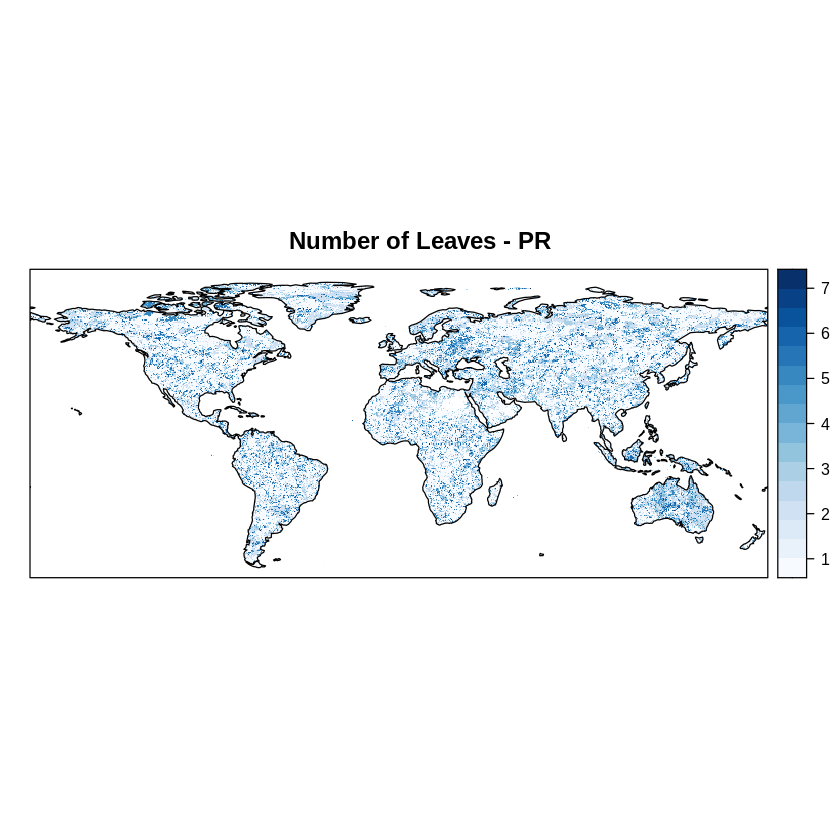

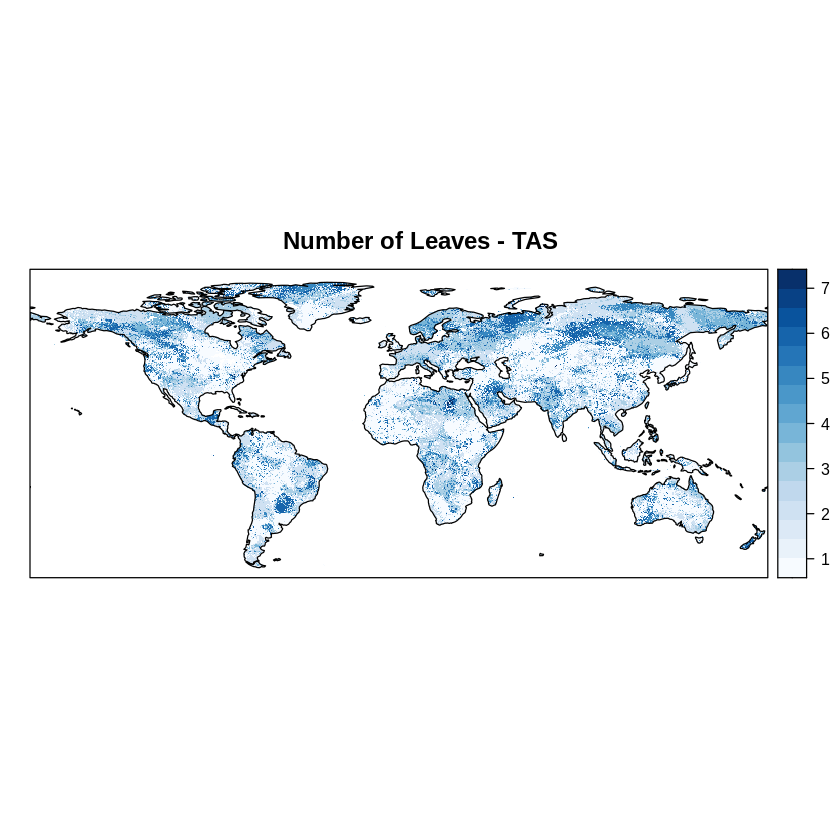

In [14]:
spatialPlot(nLeaves_pr_graph, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'Number of Leaves - PR')
spatialPlot(nLeaves_tas_graph, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'Number of Leaves - TAS')

In [15]:
start_time = Sys.time()

for(iyear in 1:dim(data_SON$Data)[1]){
    for(i in 1:length(data_SON$xyCoords$x)){
        for(j in 1:length(data_SON$xyCoords$y)){
            if(length(which(is.na(data_SON$Data[,j,i])==FALSE))>2){
                indices_SON$grid = data_SON$Data[, j,i]
                indices_SON_LT1$grid = data_SON$Data[, j,i]
                indices_SON_LT4$grid = data_SON$Data[, j,i]
                
                mod <- tree(grid ~ ., data = indices_SON[-iyear,])
                if(is.na(nLeaves_pr[j,i]) == TRUE){
                    pred = predict(mod, indices_SON[iyear,])
                    pred_LT1 = predict(mod, indices_SON_LT1[iyear,])
                    pred_LT4 = predict(mod, indices_SON_LT4[iyear,])
                    
                    predict_pr_tree$Data[iyear, j, i] <- pred
                    predict_pr_tree_LT1$Data[iyear, j, i] <- pred_LT1
                    predict_pr_tree_LT4$Data[iyear, j, i] <- pred_LT4
                }else{
                    mod.opt <- prune.tree(mod, best = nLeaves_pr[j,i])
                    if(class(mod.opt)=='singlenode'){
                        next
                    }
                    pred = predict(mod, indices_SON[iyear,])
                    pred_LT1 = predict(mod, indices_SON_LT1[iyear,])
                    pred_LT4 = predict(mod, indices_SON_LT4[iyear,])
                    
                    predict_pr_tree$Data[iyear, j, i] <- pred
                    predict_pr_tree_LT1$Data[iyear, j, i] <- pred_LT1
                    predict_pr_tree_LT4$Data[iyear, j, i] <- pred_LT4
                }
            }
        }
    }
}

end_time = Sys.time()
print(end_time - start_time)

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is 

Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_pr[j, i]):
“best is bigger than tree size”


Time difference of 1.35822 hours


In [16]:
start_time = Sys.time()

for(iyear in 1:dim(data_SON_temp$Data)[1]){
    for(i in 1:length(data_SON_temp$xyCoords$x)){
        for(j in 1:length(data_SON_temp$xyCoords$y)){
            if(length(which(is.na(data_SON_temp$Data[,j,i])==FALSE))>2){
                indices_SON$grid = data_SON_temp$Data[, j,i]
                indices_SON_LT1$grid = data_SON_temp$Data[, j,i]
                indices_SON_LT4$grid = data_SON_temp$Data[, j,i]
                
                mod <- tree(grid ~ ., data = indices_SON[-iyear,])
                if(is.na(nLeaves_tas[j,i]) == TRUE){
                    pred = predict(mod, indices_SON[iyear,])
                    pred_LT1 = predict(mod, indices_SON_LT1[iyear,])
                    pred_LT4 = predict(mod, indices_SON_LT4[iyear,])
                    
                    predict_tas_tree$Data[iyear, j, i] <- pred
                    predict_tas_tree_LT1$Data[iyear, j, i] <- pred_LT1
                    predict_tas_tree_LT4$Data[iyear, j, i] <- pred_LT4
                }else{
                    mod.opt <- prune.tree(mod, best = nLeaves_tas[j,i])
                    if(class(mod.opt)=='singlenode'){
                        next
                    }
                    pred = predict(mod, indices_SON[iyear,])
                    pred_LT1 = predict(mod, indices_SON_LT1[iyear,])
                    pred_LT4 = predict(mod, indices_SON_LT4[iyear,])
                    
                    predict_tas_tree$Data[iyear, j, i] <- pred
                    predict_tas_tree_LT1$Data[iyear, j, i] <- pred_LT1
                    predict_tas_tree_LT4$Data[iyear, j, i] <- pred_LT4
                }
            }
        }
    }
}

end_time = Sys.time()
print(end_time - start_time)

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i]):
“best is bigger than tree size”
Warning message in prune.tree(mod, best = nLeaves_tas[j, i])

Time difference of 1.458954 hours


In [17]:
save(predict_pr_tree, file = "predict_pr_tree.rda") 
save(predict_tas_tree, file = "predict_tas_tree.rda") 
save(predict_pr_tree_LT1, file = "predict_pr_tree_LT1.rda") 
save(predict_tas_tree_LT1, file = "predict_tas_tree_LT1.rda") 
save(predict_pr_tree_LT4, file = "predict_pr_tree_LT4.rda") 
save(predict_tas_tree_LT4, file = "predict_tas_tree_LT4.rda") 

In [18]:
rmse_pr_tree = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
acc_pr_tree = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
rmse_pr_tree_LT1 = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
acc_pr_tree_LT1 = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
rmse_pr_tree_LT4 = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
acc_pr_tree_LT4 = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
for(i in 1:length(data_SON$xyCoords$x)){
    for(j in 1:length(data_SON$xyCoords$y)){
        if(length(which(is.na(data_SON$Data[,j,i])==FALSE))>2){
            rmse_pr_tree[j,i] = rmse(data_SON$Data[,j,i],predict_pr_tree$Data[,j,i])
            acc_pr_tree[j,i] = acc(data_SON$Data[,j,i],predict_pr_tree$Data[,j,i])
            
            rmse_pr_tree_LT1[j,i] = rmse(data_SON$Data[,j,i],predict_pr_tree_LT1$Data[,j,i])
            acc_pr_tree_LT1[j,i] = acc(data_SON$Data[,j,i],predict_pr_tree_LT1$Data[,j,i])
            
            rmse_pr_tree_LT4[j,i] = rmse(data_SON$Data[,j,i],predict_pr_tree_LT4$Data[,j,i])
            acc_pr_tree_LT4[j,i] = acc(data_SON$Data[,j,i],predict_pr_tree_LT4$Data[,j,i])
            
       }
    }
}

rmse_tas_tree = matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
acc_tas_tree= matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
rmse_tas_tree_LT1 = matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
acc_tas_tree_LT1= matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
rmse_tas_tree_LT4 = matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
acc_tas_tree_LT4 = matrix(NA, nrow = length(data_SON_temp$xyCoords$y), ncol = length(data_SON_temp$xyCoords$x))
for(i in 1:length(data_SON_temp$xyCoords$x)){
    for(j in 1:length(data_SON_temp$xyCoords$y)){
        if(length(which(is.na(data_SON_temp$Data[,j,i])==FALSE))>2){
            rmse_tas_tree[j,i] = rmse(data_SON_temp$Data[,j,i],predict_tas_tree$Data[,j,i])
            acc_tas_tree[j,i] = acc(data_SON_temp$Data[,j,i],predict_tas_tree$Data[,j,i])
            
            rmse_tas_tree_LT1[j,i] = rmse(data_SON_temp$Data[,j,i],predict_tas_tree_LT1$Data[,j,i])
            acc_tas_tree_LT1[j,i] = acc(data_SON_temp$Data[,j,i],predict_tas_tree_LT1$Data[,j,i])
            
            rmse_tas_tree_LT4[j,i] = rmse(data_SON_temp$Data[,j,i],predict_tas_tree_LT4$Data[,j,i])
            acc_tas_tree_LT4[j,i] = acc(data_SON_temp$Data[,j,i],predict_tas_tree_LT4$Data[,j,i])
       }
    }
}

In [19]:
makeC4R = function(data, template) {  # creates a C4R object from the "data" matrix
  C4R = template; C4R$Data = data; attributes(C4R$Data) = attributes(template$Data)
  return(C4R)
}
template = subsetDimension(data_SON, dimension = "time", indices = 1)
rmse_pr_tree= makeC4R(rmse_pr_tree,template)
acc_pr_tree= makeC4R(acc_pr_tree,template)
rmse_pr_tree_LT1 = makeC4R(rmse_pr_tree_LT1,template)
acc_pr_tree_LT1 = makeC4R(acc_pr_tree_LT1,template)
rmse_pr_tree_LT4= makeC4R(rmse_pr_tree_LT4,template)
acc_pr_tree_LT4= makeC4R(acc_pr_tree_LT4,template)

rmse_tas_tree= makeC4R(rmse_tas_tree,template)
acc_tas_tree= makeC4R(acc_tas_tree,template)
rmse_tas_tree_LT1= makeC4R(rmse_tas_tree_LT1,template)
acc_tas_tree_LT1= makeC4R(acc_tas_tree_LT1,template)
rmse_tas_tree_LT4= makeC4R(rmse_tas_tree_LT4,template)
acc_tas_tree_LT4= makeC4R(acc_tas_tree_LT4,template)

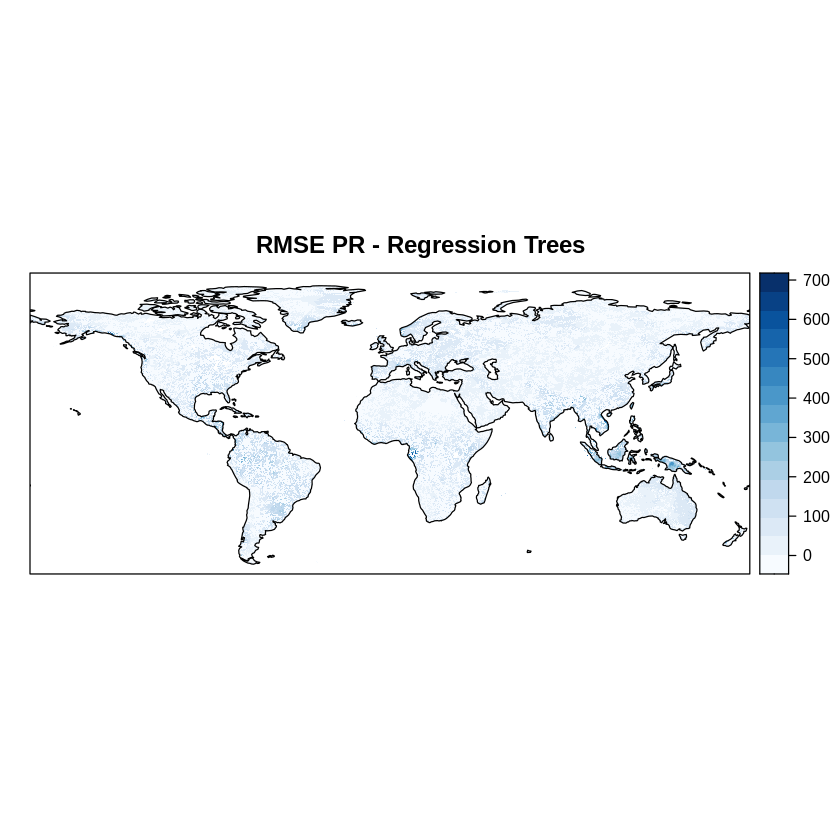

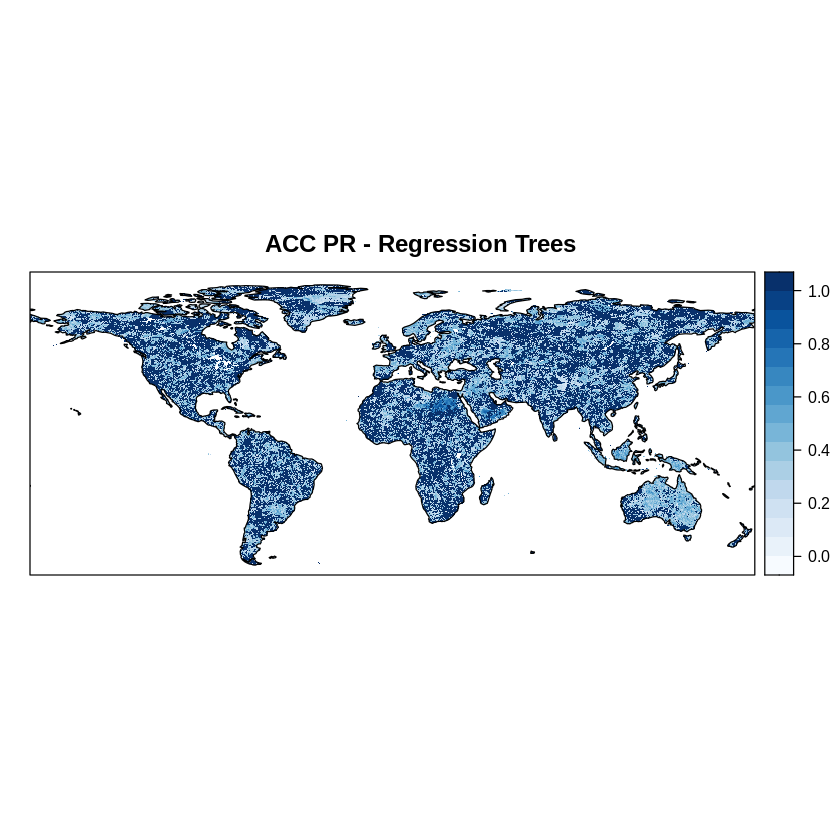

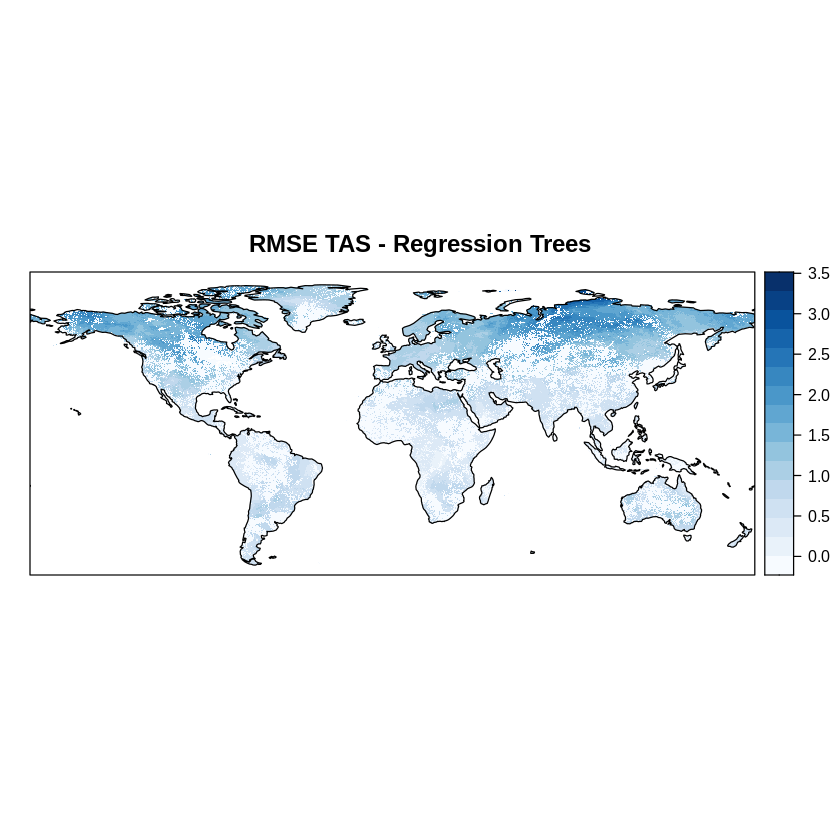

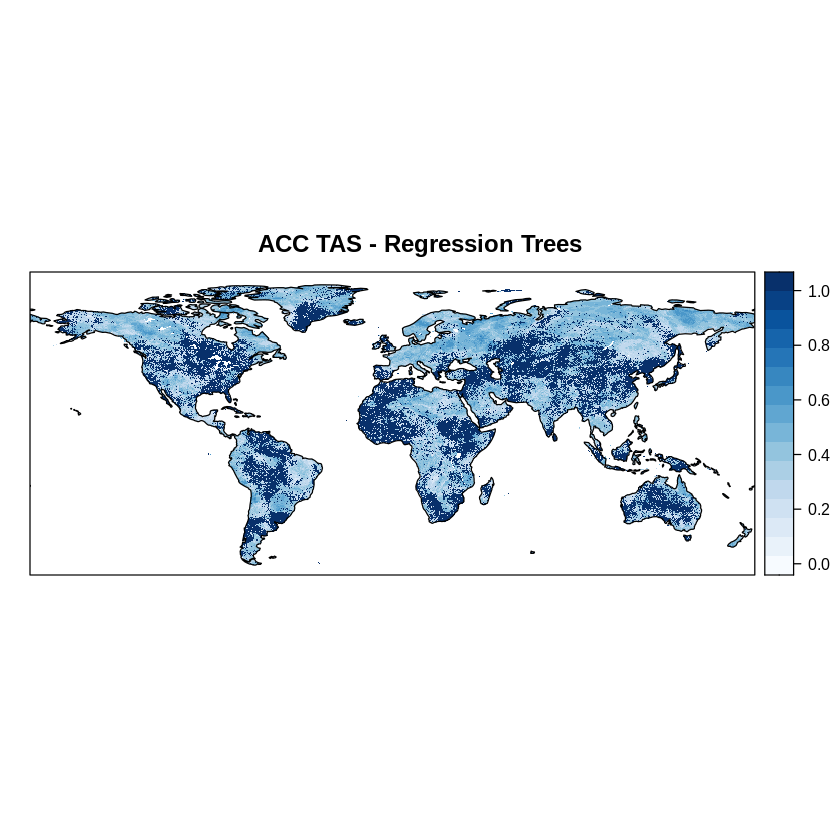

In [20]:
spatialPlot(rmse_pr_tree, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE PR - Regression Trees')
spatialPlot(acc_pr_tree, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC PR - Regression Trees')
spatialPlot(rmse_tas_tree, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE TAS - Regression Trees')
spatialPlot(acc_tas_tree, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC TAS - Regression Trees')

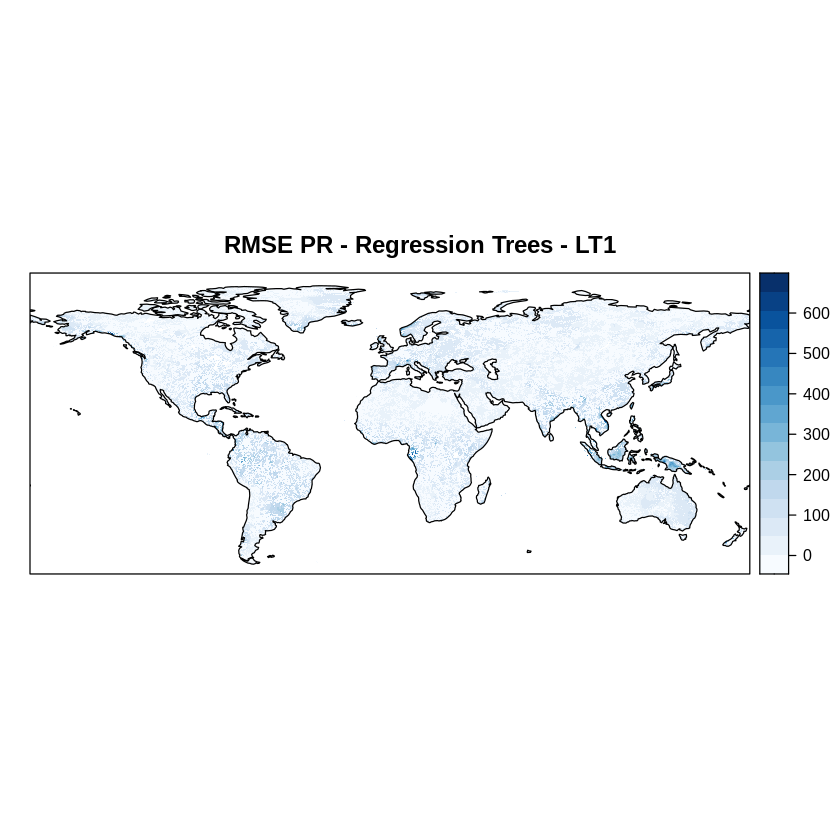

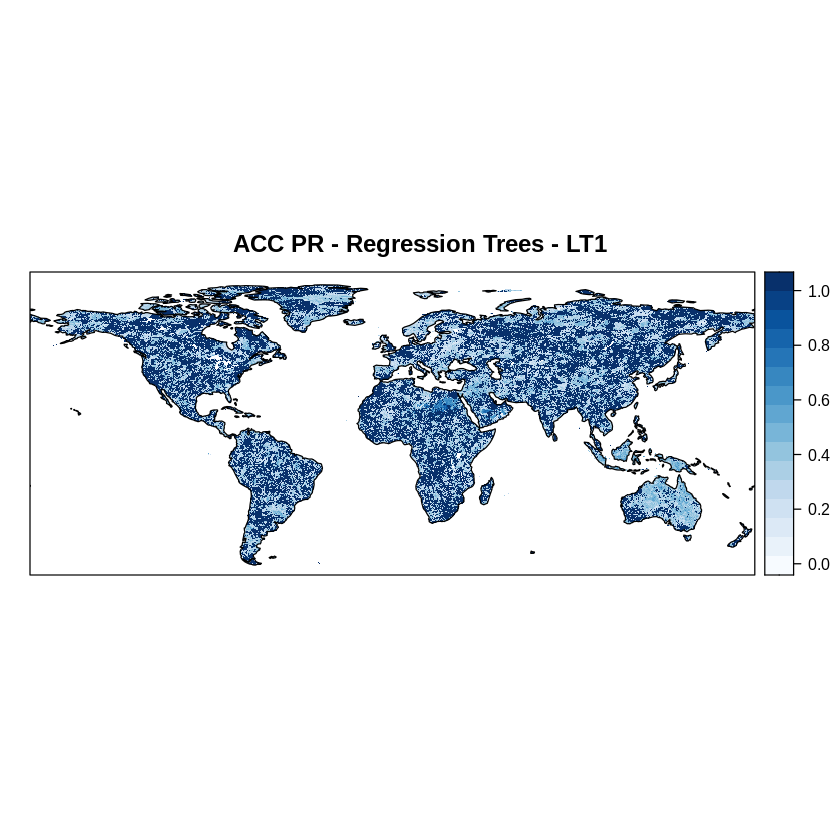

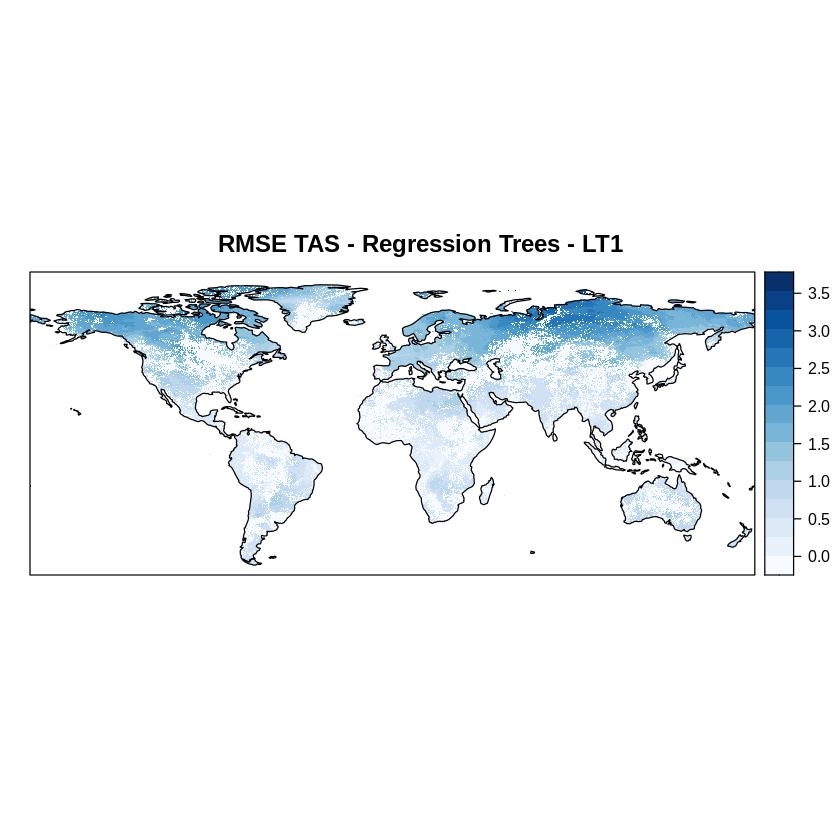

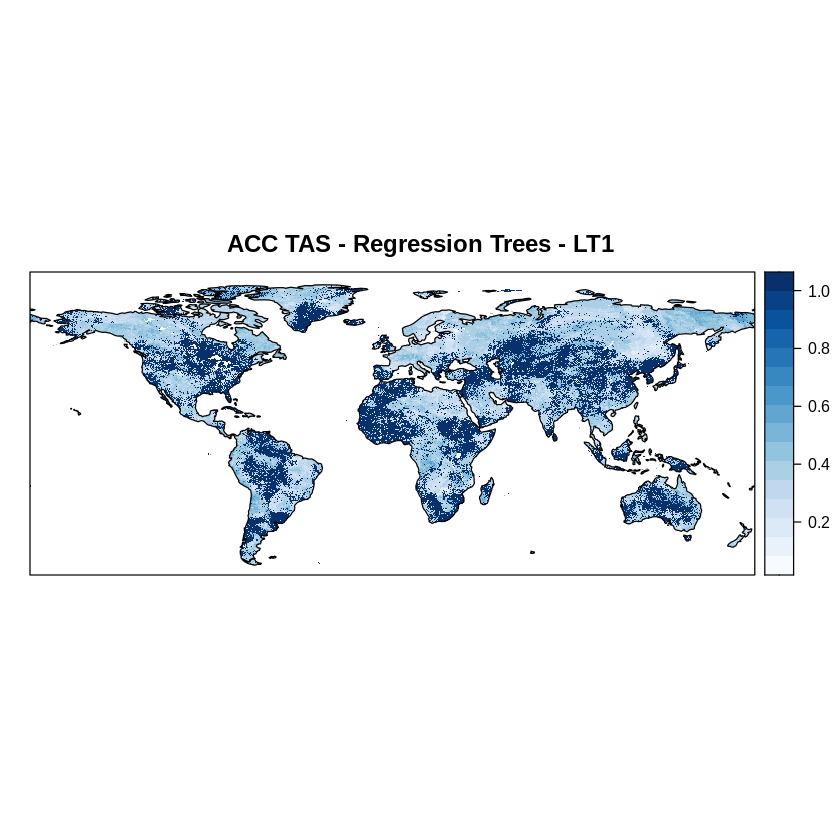

In [21]:
spatialPlot(rmse_pr_tree_LT1, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE PR - Regression Trees - LT1')
spatialPlot(acc_pr_tree_LT1, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC PR - Regression Trees - LT1')
spatialPlot(rmse_tas_tree_LT1, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE TAS - Regression Trees - LT1')
spatialPlot(acc_tas_tree_LT1, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC TAS - Regression Trees - LT1')

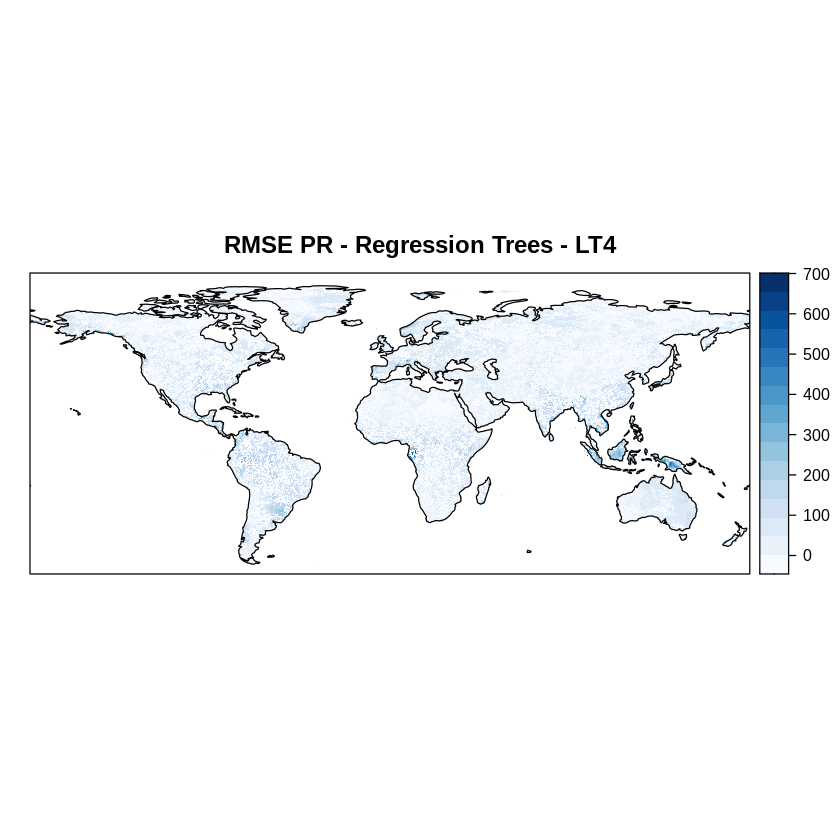

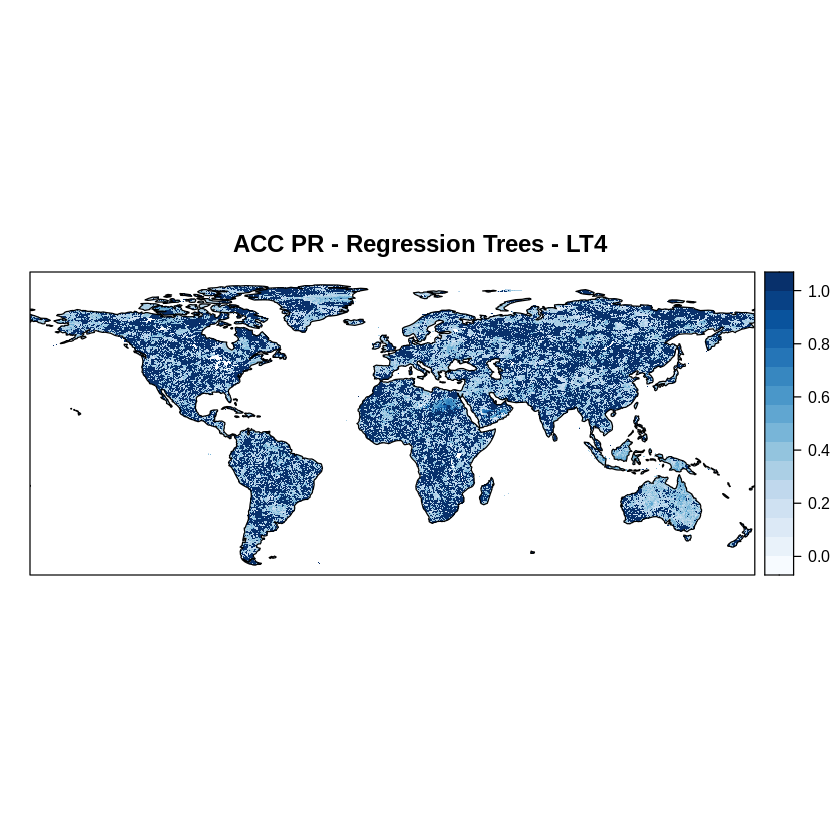

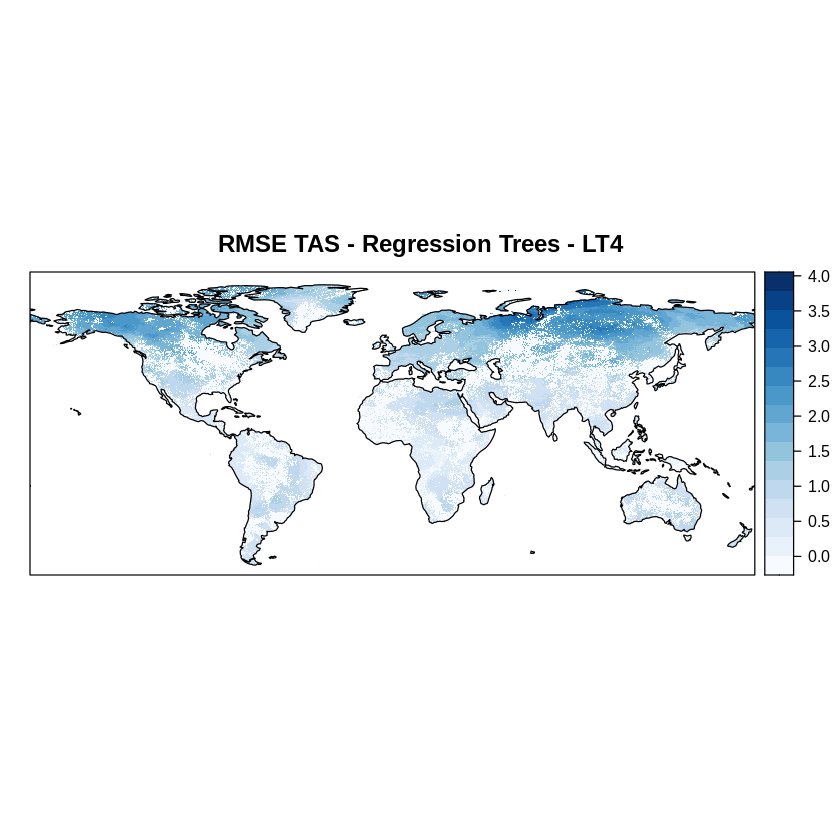

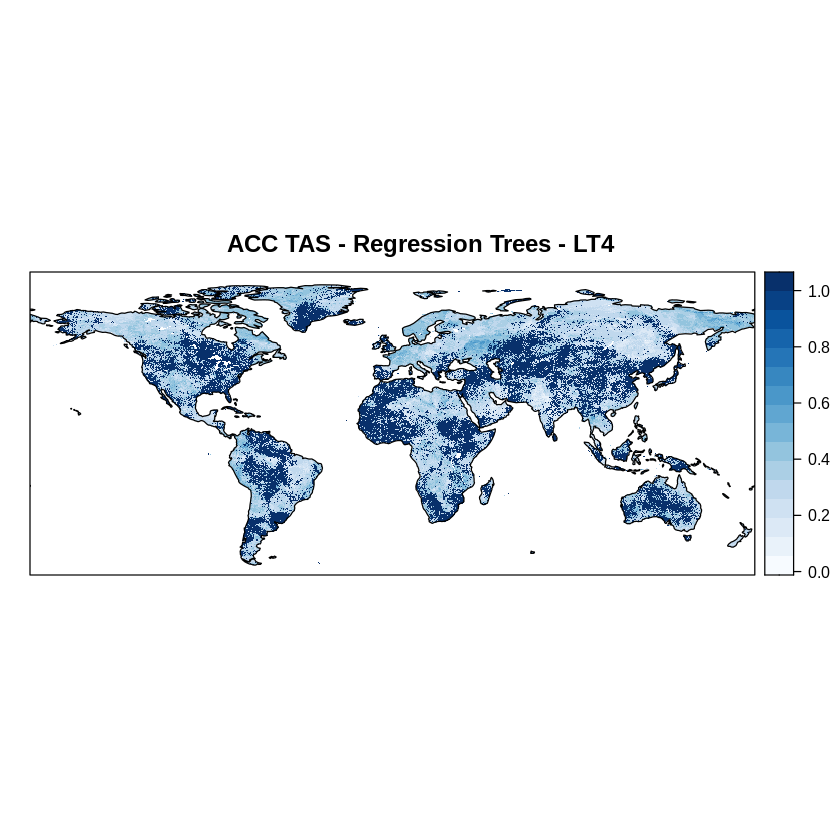

In [22]:
spatialPlot(rmse_pr_tree_LT4, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE PR - Regression Trees - LT4')
spatialPlot(acc_pr_tree_LT4, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC PR - Regression Trees - LT4')
spatialPlot(rmse_tas_tree_LT4, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE TAS - Regression Trees - LT4')
spatialPlot(acc_tas_tree_LT4, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC TAS - Regression Trees - LT4')

In [13]:
nLeaves_pr_holdout = matrix(NA,ncol=length(data_SON$xyCoords$x), nrow = length(data_SON$xyCoords$y))
nLeaves_tas_holdout = matrix(NA,ncol=length(data_SON_temp$xyCoords$x), nrow = length(data_SON_temp$xyCoords$y))

In [14]:
library(tree)

start_time <- Sys.time()

n = dim(indices_SON)[1]
set.seed(2)
indtrain = sample(1:n, round(0.5*n))
indtest = setdiff(1:n, indtrain)

for (i in 1:length(data_SON$xyCoords$x)) {
    for (j in 1:length(data_SON$xyCoords$y)) {
        if (length(which(!is.na(data_SON$Data[, j, i]))) > 2) {
        
            indices_SON$grid <- as.numeric(data_SON$Data[, j, i])
        
            dataset.train = indices_SON[indtrain, ]
            dataset.test = indices_SON[indtest, ]
            mod <- tree(grid ~ ., data = dataset.train)
        
        # Obtener el número de hojas óptimo si es posible
            if (length(levels(factor(mod$frame$var)))>2 && length(levels(factor(indices_SON$grid)))>4) {
              mod.cv <- cv.tree(mod, FUN = prune.tree, K =17)
              nLeaves <- mod.cv$size[which.min(mod.cv$dev)]
              nLeaves_pr_holdout[j,i] = nLeaves
            }
        
       }
    }
}

end_time <- Sys.time()
print(end_time - start_time)


Time difference of 11.18746 mins


In [15]:
start_time <- Sys.time()

n = dim(indices_SON)[1]
set.seed(2)
indtrain = sample(1:n, round(0.5*n))
indtest = setdiff(1:n, indtrain)

for (i in 1:length(data_SON_temp$xyCoords$x)) {
    for (j in 1:length(data_SON_temp$xyCoords$y)) {
        if (length(which(!is.na(data_SON_temp$Data[, j, i]))) > 2) {
        
            indices_SON$grid <- as.numeric(data_SON_temp$Data[, j, i])
        
            dataset.train = indices_SON[indtrain, ]
            dataset.test = indices_SON[indtest, ]
            mod <- tree(grid ~ ., data = dataset.train)
        
        # Obtener el número de hojas óptimo si es posible
            if (length(levels(factor(mod$frame$var)))>2 && length(levels(factor(indices_SON$grid)))>2) {
              mod.cv <- cv.tree(mod, FUN = prune.tree, K =17)
              nLeaves <- mod.cv$size[which.min(mod.cv$dev)]
              nLeaves_tas_holdout[j,i] = nLeaves
            }
        
       }
    }
}

end_time <- Sys.time()
print(end_time - start_time)


ERROR: Error in prune.tree(structure(list(frame = structure(list(var = structure(1L, .Label = c("<leaf>", : can not prune singlenode tree


In [12]:
library(tree)

In [16]:
predict_pr_tree_holdout = data_SON
predict_tas_tree_holdout = data_SON_temp

In [17]:
load("./nLeaves_pr.rda",verbose = T)
load("./nLeaves_tas.rda",verbose = T)

Loading objects:
  nLeaves_pr
Loading objects:
  nLeaves_tas


In [18]:
start_time = Sys.time()

rmse_pr_regression_holdout = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
acc_pr_regression_holdout = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))

n = dim(indices_SON)[1]
set.seed(2)
indtrain = sample(1:n, round(0.5*n))
indtest = setdiff(1:n, indtrain)

for(i in 1:length(data_SON$xyCoords$x)){
    for(j in 1:length(data_SON$xyCoords$y)){
        if(length(which(is.na(data_SON$Data[,j,i])==FALSE))>2){
            indices_SON$grid = data_SON$Data[, j,i]
            
            dataset.train = indices_SON[indtrain, ]
            dataset.test = indices_SON[indtest, ]
            mod <- tree(grid ~ ., data = dataset.train)
            if(is.na(nLeaves_pr_holdout[j,i]) == TRUE){
                pred= predict(mod, dataset.test )
            }else{
                mod.opt <- prune.tree(mod, best = nLeaves_pr_holdout[j,i])
                if(class(mod.opt)=='singlenode'){
                    next
                }
                pred <- predict(mod.opt, dataset.test )
                }
                
            rmse_pr_regression_holdout[j,i] = rmse(dataset.test$grid,pred)
            acc_pr_regression_holdout[j,i] = acc(dataset.test$grid,pred)
        }
    }
}


end_time = Sys.time()
print(end_time - start_time)

Time difference of 1.768845 mins


In [19]:
start_time = Sys.time()

rmse_tas_regression_holdout = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
acc_tas_regression_holdout = matrix(NA, nrow = length(data_SON$xyCoords$y), ncol = length(data_SON$xyCoords$x))
n = dim(indices_SON)[1]
set.seed(2)
indtrain = sample(1:n, round(0.5*n))
indtest = setdiff(1:n, indtrain)

for(i in 1:length(data_SON_temp$xyCoords$x)){
    for(j in 1:length(data_SON_temp$xyCoords$y)){
        if(length(which(is.na(data_SON_temp$Data[,j,i])==FALSE))>2){
            indices_SON$grid = data_SON_temp$Data[, j,i]
           
            dataset.train = indices_SON[indtrain, ]
            dataset.test = indices_SON[indtest, ]
            mod <- tree(grid ~ ., data = dataset.train)
            if(is.na(nLeaves_tas_holdout[j,i]) == TRUE){
                pred= predict(mod, dataset.test )
            }else{
                mod.opt <- prune.tree(mod, best = nLeaves_tas_holdout[j,i])
                if(class(mod.opt)=='singlenode'){
                    next
                }
                pred <- predict(mod.opt, dataset.test )
                }
                
            rmse_tas_regression_holdout[j,i] = rmse(dataset.test$grid,pred)
            acc_tas_regression_holdout[j,i] = acc(dataset.test$grid,pred)
        }
    }
}


end_time = Sys.time()
print(end_time - start_time)


Time difference of 1.744502 mins


In [20]:
makeC4R = function(data, template) {  # creates a C4R object from the "data" matrix
  C4R = template; C4R$Data = data; attributes(C4R$Data) = attributes(template$Data)
  return(C4R)
}
template = subsetDimension(data_SON, dimension = "time", indices = 1)
rmse_pr_regression_holdout= makeC4R(rmse_pr_regression_holdout,template)
acc_pr_regression_holdout= makeC4R(acc_pr_regression_holdout,template)

rmse_tas_regression_holdout= makeC4R(rmse_tas_regression_holdout,template)
acc_tas_regression_holdout= makeC4R(acc_tas_regression_holdout,template)

In [21]:
library(RColorBrewer)
colstx <- rev(brewer.pal(n = 9, "Spectral"))
colsindex <- rev(brewer.pal(n = 9, "RdYlBu"))
colsdelta <- brewer.pal(n = 9, "Reds")
colsbias <- brewer.pal(n = 9, "PiYG")
colssd <- brewer.pal(n = 9, "Blues")

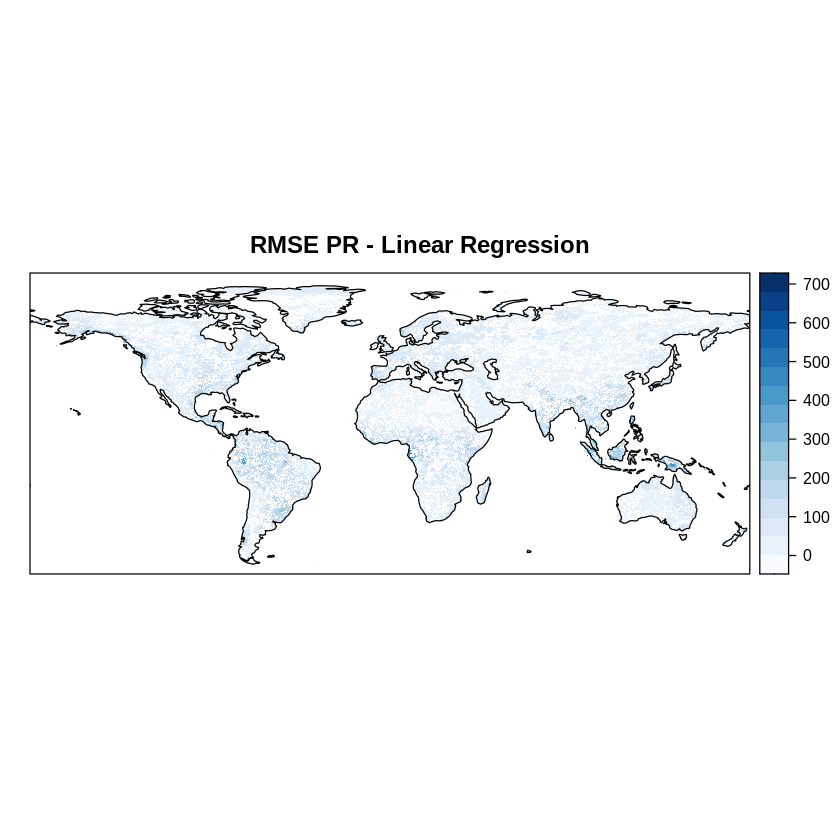

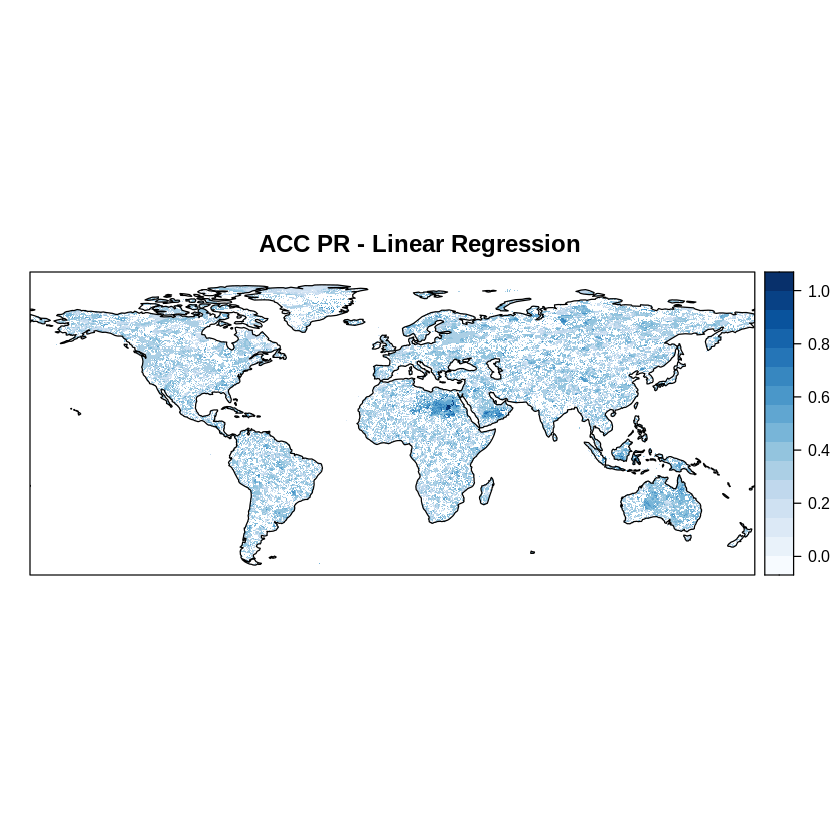

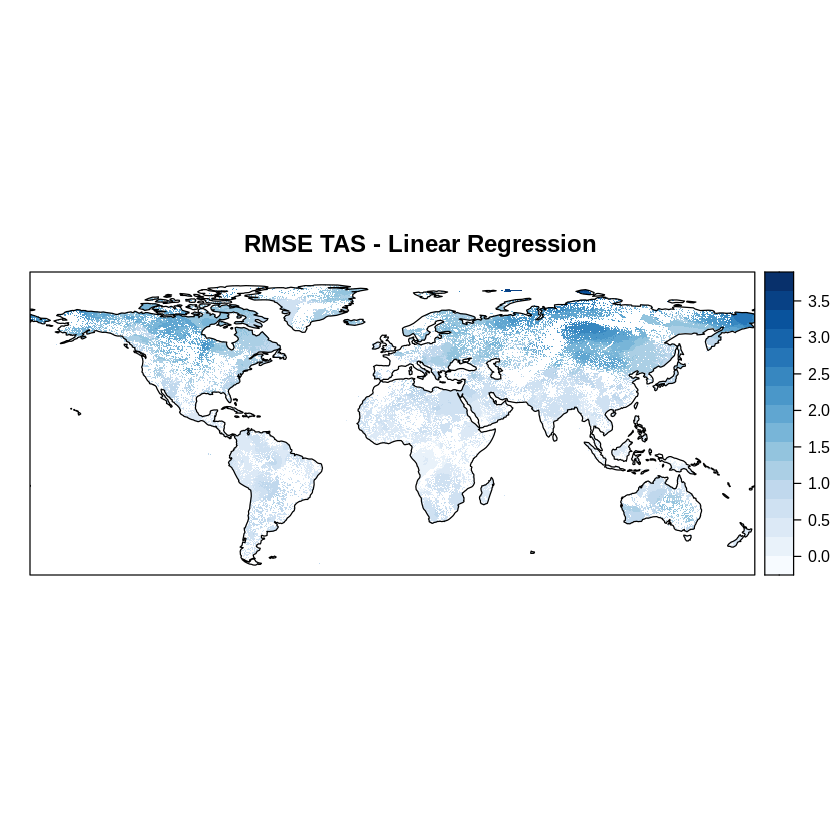

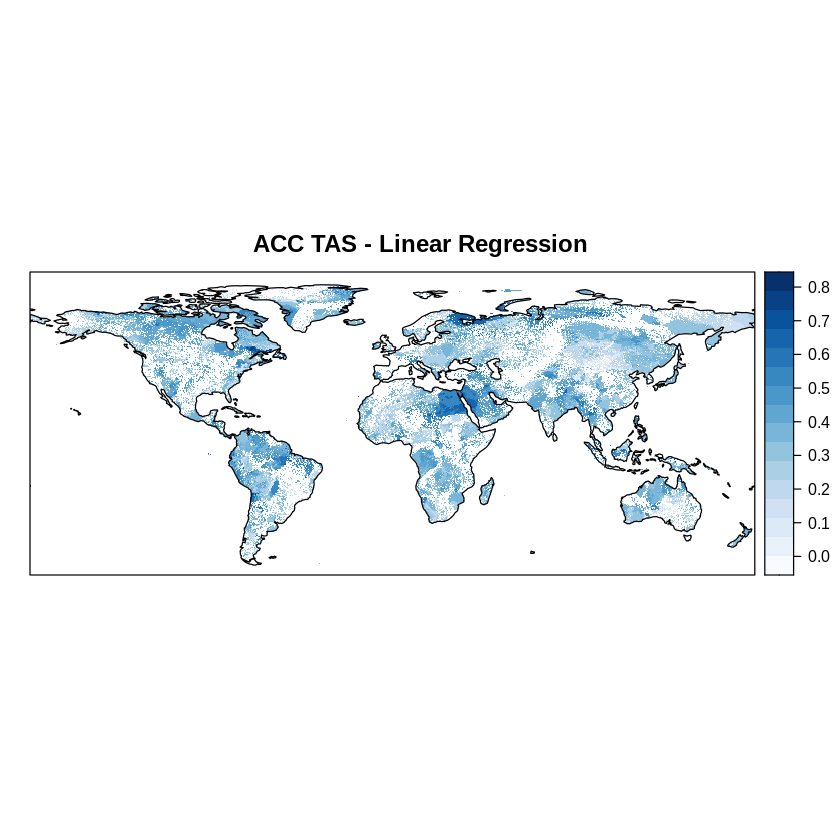

In [22]:
spatialPlot(rmse_pr_regression_holdout, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE PR - Linear Regression')
spatialPlot(acc_pr_regression_holdout, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC PR - Linear Regression')
spatialPlot(rmse_tas_regression_holdout, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'RMSE TAS - Linear Regression')
spatialPlot(acc_tas_regression_holdout, backdrop.theme = "coastline", col.regions = colorRampPalette(colssd),
            main = 'ACC TAS - Linear Regression')